## Modelo de Riesgos Proporcionales para Covid-19 en México (2022)

## Estimadores de Kaplan-Meier

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sn
from sksurv.nonparametric import kaplan_meier_estimator
from sksurv.metrics import concordance_index_censored

In [5]:
data = pd.read_csv("COVID19MEXICO2022_muestra.csv")

In [6]:
data.head()

,sexo,entidad_res,tipo_paciente,fecha_ingreso,fecha_sintomas,fecha_def,intubado,neumonia,edad,nacionalidad,...,obesidad,renal_cronica,tabaquismo,otro_caso,resultado_lab,toma_muestra_antigeno,resultado_antigeno,clasificacion,migrante,defuncion
0,2,31,2,2022-06-21,2022-06-14,2022-06-30,2,2,82,1,...,2,2,2,1,1,1,1,3,99,1
1,2,15,2,2022-02-02,2022-02-01,2022-02-11,2,2,86,1,...,2,2,2,2,1,1,1,3,99,1
2,2,20,2,2022-02-07,2022-01-31,2022-02-10,2,1,81,1,...,2,2,2,2,1,1,1,3,99,1
3,2,8,2,2022-07-21,2022-07-18,2022-07-22,1,1,65,1,...,2,2,1,2,97,1,1,3,99,1
4,2,16,2,2022-01-29,2022-01-26,2022-01-30,2,1,75,1,...,2,2,2,1,1,1,1,3,99,1


In [14]:
data_mod = data.copy()

drop_cols = ["entidad_res", "toma_muestra_antigeno", "resultado_lab", "clasificacion", "migrante", "embarazo",
             "resultado_antigeno"]

data_mod.drop(columns=drop_cols, inplace=True)

In [15]:
data_mod.head()

,sexo,tipo_paciente,fecha_ingreso,fecha_sintomas,fecha_def,intubado,neumonia,edad,nacionalidad,indigena,...,asma,inmusupr,hipertension,otra_com,cardiovascular,obesidad,renal_cronica,tabaquismo,otro_caso,defuncion
0,2,2,2022-06-21,2022-06-14,2022-06-30,2,2,82,1,2,...,2,2,1,2,2,2,2,2,1,1
1,2,2,2022-02-02,2022-02-01,2022-02-11,2,2,86,1,2,...,2,2,2,2,2,2,2,2,2,1
2,2,2,2022-02-07,2022-01-31,2022-02-10,2,1,81,1,2,...,2,2,2,2,2,2,2,2,2,1
3,2,2,2022-07-21,2022-07-18,2022-07-22,1,1,65,1,2,...,2,1,2,1,2,2,2,1,2,1
4,2,2,2022-01-29,2022-01-26,2022-01-30,2,1,75,1,2,...,2,2,2,2,2,2,2,2,1,1


In [16]:
data_mod.columns

Index(['sexo', 'tipo_paciente', 'fecha_ingreso', 'fecha_sintomas', 'fecha_def',
       'intubado', 'neumonia', 'edad', 'nacionalidad', 'indigena', 'diabetes',
       'epoc', 'asma', 'inmusupr', 'hipertension', 'otra_com',
       'cardiovascular', 'obesidad', 'renal_cronica', 'tabaquismo',
       'otro_caso', 'defuncion'],
      dtype='object')

In [17]:
# Vemos si hay valores nulos
data_mod.isnull().sum()

sexo                 0
tipo_paciente        0
fecha_ingreso        0
fecha_sintomas       0
fecha_def         7000
intubado             0
neumonia             0
edad                 0
nacionalidad         0
indigena             0
diabetes             0
epoc                 0
asma                 0
inmusupr             0
hipertension         0
otra_com             0
cardiovascular       0
obesidad             0
renal_cronica        0
tabaquismo           0
otro_caso            0
defuncion            0
dtype: int64

In [18]:
# Convertimos a Valores Nulos, cierta códificación.
si_no_vars = ['intubado', 'neumonia', 'nacionalidad', 'indigena', 'diabetes',
       'epoc', 'asma', 'inmusupr', 'hipertension', 'otra_com',
       'cardiovascular', 'obesidad', 'renal_cronica', 'tabaquismo',
       'otro_caso', 'defuncion']

na_code = [97, 98, 99]

for var in si_no_vars:
    data_mod[var] = data_mod[var].replace(na_code, pd.NA)
# Revisamos nuevamente si hay valores nulos
data_mod.isnull().sum()

sexo                 0
tipo_paciente        0
fecha_ingreso        0
fecha_sintomas       0
fecha_def         7000
intubado          6859
neumonia            32
edad                 0
nacionalidad         0
indigena           289
diabetes            31
epoc                29
asma                29
inmusupr            28
hipertension        30
otra_com            84
cardiovascular      32
obesidad            28
renal_cronica       31
tabaquismo          32
otro_caso          161
defuncion            0
dtype: int64

In [19]:
data_mod.head()


,sexo,tipo_paciente,fecha_ingreso,fecha_sintomas,fecha_def,intubado,neumonia,edad,nacionalidad,indigena,...,asma,inmusupr,hipertension,otra_com,cardiovascular,obesidad,renal_cronica,tabaquismo,otro_caso,defuncion
0,2,2,2022-06-21,2022-06-14,2022-06-30,2,2,82,1,2,...,2,2,1,2,2,2,2,2,1,1
1,2,2,2022-02-02,2022-02-01,2022-02-11,2,2,86,1,2,...,2,2,2,2,2,2,2,2,2,1
2,2,2,2022-02-07,2022-01-31,2022-02-10,2,1,81,1,2,...,2,2,2,2,2,2,2,2,2,1
3,2,2,2022-07-21,2022-07-18,2022-07-22,1,1,65,1,2,...,2,1,2,1,2,2,2,1,2,1
4,2,2,2022-01-29,2022-01-26,2022-01-30,2,1,75,1,2,...,2,2,2,2,2,2,2,2,1,1


In [20]:
# Eliminamos la variable entubado dado que tiene casi todos sus valores nulos
data_mod.drop(columns=['intubado'], inplace=True)
# Revisamos nuevamente si hay valores nulos
data_mod.isnull().sum()

sexo                 0
tipo_paciente        0
fecha_ingreso        0
fecha_sintomas       0
fecha_def         7000
neumonia            32
edad                 0
nacionalidad         0
indigena           289
diabetes            31
epoc                29
asma                29
inmusupr            28
hipertension        30
otra_com            84
cardiovascular      32
obesidad            28
renal_cronica       31
tabaquismo          32
otro_caso          161
defuncion            0
dtype: int64

In [21]:
# Adaptamos los datos de tiempo para el análisis de supervivencia
data_mod["fin_ano"] = pd.to_datetime("2022-12-31", format="%Y-%m-%d")

In [22]:
data_mod.head()

,sexo,tipo_paciente,fecha_ingreso,fecha_sintomas,fecha_def,neumonia,edad,nacionalidad,indigena,diabetes,...,inmusupr,hipertension,otra_com,cardiovascular,obesidad,renal_cronica,tabaquismo,otro_caso,defuncion,fin_ano
0,2,2,2022-06-21,2022-06-14,2022-06-30,2,82,1,2,2,...,2,1,2,2,2,2,2,1,1,2022-12-31
1,2,2,2022-02-02,2022-02-01,2022-02-11,2,86,1,2,1,...,2,2,2,2,2,2,2,2,1,2022-12-31
2,2,2,2022-02-07,2022-01-31,2022-02-10,1,81,1,2,1,...,2,2,2,2,2,2,2,2,1,2022-12-31
3,2,2,2022-07-21,2022-07-18,2022-07-22,1,65,1,2,1,...,1,2,1,2,2,2,1,2,1,2022-12-31
4,2,2,2022-01-29,2022-01-26,2022-01-30,1,75,1,2,2,...,2,2,2,2,2,2,2,1,1,2022-12-31


In [26]:
# Convertimos las fechas a datetime
data_mod["fecha_sintomas"] = pd.to_datetime(data_mod["fecha_sintomas"], format="%Y-%m-%d")
data_mod["fecha_def"] = pd.to_datetime(data_mod["fecha_def"], format="%Y-%m-%d")

# Creamos la variable de tiempo
data_mod["tiempo"] = pd.NA


# Calculamos el tiempo de supervivencia
for i in range(len(data_mod)):
    if data_mod["defuncion"][i] == 1:
        data_mod["tiempo"][i] = (data_mod["fecha_def"][i] - data_mod["fecha_sintomas"][i]).days
    else:
        data_mod["tiempo"][i] = (data_mod["fin_ano"][i] - data_mod["fecha_sintomas"][i]).days 

data_mod.head()

/var/folders/1r/_v7rjp7n2cqdpwmp59hrsm000000gq/T/ipykernel_32264/3444926173.py:12: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  data_mod["tiempo"][i] = (data_mod["fecha_def"][i] - data_mod["fecha_sintomas"][i]).days
/var/folders/1r/_v7rjp7n

,sexo,tipo_paciente,fecha_ingreso,fecha_sintomas,fecha_def,neumonia,edad,nacionalidad,indigena,diabetes,...,hipertension,otra_com,cardiovascular,obesidad,renal_cronica,tabaquismo,otro_caso,defuncion,fin_ano,tiempo
0,2,2,2022-06-21,2022-06-14,2022-06-30,2,82,1,2,2,...,1,2,2,2,2,2,1,1,2022-12-31,16
1,2,2,2022-02-02,2022-02-01,2022-02-11,2,86,1,2,1,...,2,2,2,2,2,2,2,1,2022-12-31,10
2,2,2,2022-02-07,2022-01-31,2022-02-10,1,81,1,2,1,...,2,2,2,2,2,2,2,1,2022-12-31,10
3,2,2,2022-07-21,2022-07-18,2022-07-22,1,65,1,2,1,...,2,1,2,2,2,1,2,1,2022-12-31,4
4,2,2,2022-01-29,2022-01-26,2022-01-30,1,75,1,2,2,...,2,2,2,2,2,2,1,1,2022-12-31,4


In [27]:
data_mod.tail()

,sexo,tipo_paciente,fecha_ingreso,fecha_sintomas,fecha_def,neumonia,edad,nacionalidad,indigena,diabetes,...,hipertension,otra_com,cardiovascular,obesidad,renal_cronica,tabaquismo,otro_caso,defuncion,fin_ano,tiempo
7995,2,1,2022-07-17,2022-07-16,NaT,2,64,1,2,1,...,1,2,1,1,1,2,2,0,2022-12-31,168
7996,1,1,2022-01-07,2022-01-03,NaT,2,67,1,2,1,...,1,2,2,2,2,2,2,0,2022-12-31,362
7997,1,1,2022-01-13,2022-01-10,NaT,2,59,1,2,2,...,2,2,2,2,2,2,1,0,2022-12-31,355
7998,2,1,2022-01-28,2022-01-24,NaT,2,45,1,2,2,...,2,2,2,2,2,2,1,0,2022-12-31,341
7999,2,1,2022-07-08,2022-07-08,NaT,2,29,1,2,2,...,2,2,2,2,2,2,2,0,2022-12-31,176


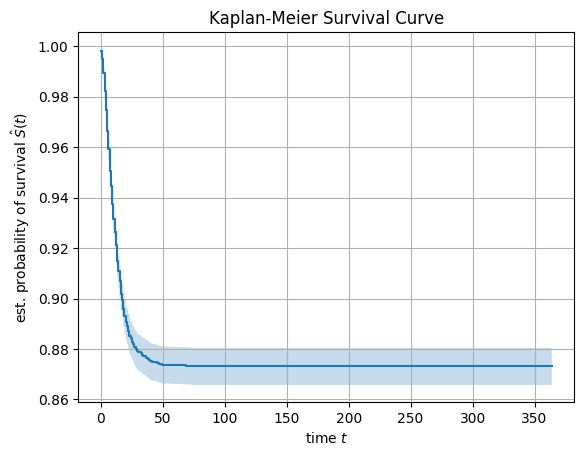

In [32]:
# Hacemos un Kaplan-Meier
# Definimos el evento y el tiempo
data_mod["event"] = data_mod["defuncion"] == 1
data_mod["tiempo"] = data_mod["tiempo"].astype("float16")

time, survival_prob, conf_int  = kaplan_meier_estimator(data_mod["event"], data_mod["tiempo"], conf_level=0.95, conf_type="log-log")

plt.step(time, survival_prob, where="post")
plt.fill_between(time, conf_int[0], conf_int[1], alpha=0.25, step="post")
plt.ylabel(r"est. probability of survival $\hat{S}(t)$")
plt.xlabel("time $t$")# Graficamos el Kaplan-Meier
plt.title("Kaplan-Meier Survival Curve")
plt.grid()
plt.show()
